In [51]:
# Basic data handling and mathematical operations
import math
import numpy as np
import pandas as pd
from scipy import stats

# Statistical modeling and evaluation
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.stattools import durbin_watson
from statsmodels.tools.tools import add_constant

# Machine learning
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, make_scorer
from sklearn.model_selection import cross_val_score, cross_validate, GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from xgboost import XGBRegressor

# Geospatial data processing
import geopandas as gpd
from pyproj import Transformer
from shapely.geometry import Point
from math import sqrt

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Feature importance
from rfpimp import importances, plot_importances

# Ignore warning
import warnings
warnings.filterwarnings("ignore")  

# Auxiliary tools
from io import BytesIO
import requests

# OSM
import osmnx as ox

In [52]:
import folium
from folium.plugins import HeatMap
from IPython.display import IFrame

import contextily as ctx

In [53]:
from mpl_toolkits.axes_grid1 import make_axes_locatable


# 1 Map

## Map of the whole UK

In [54]:
collision = 'dft-road-casualty-statistics-collision-last-5-years.csv'

df_collision = pd.read_csv(collision)
df_collision['accident_index'] = df_collision['accident_index'].astype(str)
df_collision.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 538461 entries, 0 to 538460
Data columns (total 36 columns):
 #   Column                                       Non-Null Count   Dtype  
---  ------                                       --------------   -----  
 0   accident_index                               538461 non-null  object 
 1   accident_year                                538461 non-null  int64  
 2   accident_reference                           538461 non-null  object 
 3   location_easting_osgr                        538325 non-null  float64
 4   location_northing_osgr                       538325 non-null  float64
 5   longitude                                    538325 non-null  float64
 6   latitude                                     538325 non-null  float64
 7   police_force                                 538461 non-null  int64  
 8   accident_severity                            538461 non-null  int64  
 9   number_of_vehicles                           538461 non-nul

In [55]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import HeatMap

# Ensure the data contains valid latitude and longitude
df_collision = df_collision.dropna(subset=['longitude', 'latitude'])

# Create a GeoDataFrame
gdf = gpd.GeoDataFrame(
    df_collision, 
    geometry=gpd.points_from_xy(df_collision.longitude, df_collision.latitude)
)

# Create a map object, setting the initial location and zoom level
map = folium.Map(location=[gdf.geometry.y.mean(), gdf.geometry.x.mean()], zoom_start=5)

# Add a heatmap to the map
HeatMap(data=gdf[['latitude', 'longitude']].dropna(), radius=9, blur=10, max_zoom=1,
        min_opacity=0.3
       ).add_to(map)
# directly display the map
map  

## Map of LSOA incident numbers

In [56]:
# read csv
casualty = pd.read_csv('london_traffic_accidents_onehot.csv')
casualty

,accident_index,age_of_casualty,casualty_severity,location_easting_osgr,location_northing_osgr,longitude,latitude,lsoa_of_accident_location,number_of_vehicles,speed_limit,...,pedestrian_crossing_physical_facilities_pedestrian_light_controlled,light_conditions_Night_time_light,light_conditions_Night_time_nolight,weather_conditions_Fog,weather_conditions_Raining/Snowing,urban_or_rural_area_Urban,junction_detail_Other_junction,junction_detail_Roundabout,junction_detail_T_junction,junction_detail_not_junction
0,2018010080971,50.0,0,529150.0,182270.0,-0.139737,51.524587,E01000854,2,30.0,...,0,1,0,0,0,1,0,0,0,1
1,2018010080971,48.0,0,529150.0,182270.0,-0.139737,51.524587,E01000854,2,30.0,...,0,1,0,0,0,1,0,0,0,1
2,2018010080973,29.0,0,542020.0,184290.0,0.046471,51.539651,E01003531,1,30.0,...,0,1,0,0,0,1,0,1,0,0
3,2018010080974,40.0,0,531720.0,182910.0,-0.102474,51.529746,E01002723,2,20.0,...,1,1,0,0,0,1,0,0,0,0
4,2018010080981,27.0,1,541450.0,183220.0,0.037828,51.530179,E01003492,2,30.0,...,1,1,0,0,1,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131161,2022481292382,62.0,1,531938.0,180948.0,-0.100093,51.512063,E01032739,1,20.0,...,0,1,0,0,0,1,0,0,0,1
131162,2022481292397,39.0,1,533151.0,181140.0,-0.082551,51.513504,E01032739,2,20.0,...,0,1,0,0,0,1,0,0,0,1
131163,2022481292410,58.0,0,532553.0,180786.0,-0.091297,51.510463,E01032739,2,20.0,...,1,0,0,0,0,1,0,0,1,0
131164,2022481292425,26.0,1,533054.0,181236.0,-0.083912,51.514390,E01032739,1,20.0,...,1,0,0,0,0,1,0,0,1,0


In [57]:
casualty.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131166 entries, 0 to 131165
Data columns (total 42 columns):
 #   Column                                                               Non-Null Count   Dtype  
---  ------                                                               --------------   -----  
 0   accident_index                                                       131166 non-null  object 
 1   age_of_casualty                                                      131166 non-null  float64
 2   casualty_severity                                                    131166 non-null  int64  
 3   location_easting_osgr                                                131166 non-null  float64
 4   location_northing_osgr                                               131166 non-null  float64
 5   longitude                                                            131166 non-null  float64
 6   latitude                                                             131166 non-null  float6

In [58]:
# lsoa
gis_path = "../statistical-gis-boundaries-london/ESRI/LSOA_2011_London_gen_MHW.shp"
gdf_LSOA = gpd.read_file(gis_path)
gdf_LSOA['area'] = gdf_LSOA.geometry.area
gdf_LSOA

,LSOA11CD,LSOA11NM,MSOA11CD,MSOA11NM,LAD11CD,LAD11NM,RGN11CD,RGN11NM,USUALRES,HHOLDRES,COMESTRES,POPDEN,HHOLDS,AVHHOLDSZ,geometry,area
0,E01000001,City of London 001A,E02000001,City of London 001,E09000001,City of London,E12000007,London,1465,1465,0,112.9,876,1.7,"POLYGON ((532105.092 182011.23, 532162.491 181...",1.333208e+05
1,E01000002,City of London 001B,E02000001,City of London 001,E09000001,City of London,E12000007,London,1436,1436,0,62.9,830,1.7,"POLYGON ((532746.813 181786.891, 532671.688 18...",2.261913e+05
2,E01000003,City of London 001C,E02000001,City of London 001,E09000001,City of London,E12000007,London,1346,1250,96,227.7,817,1.5,"POLYGON ((532135.145 182198.119, 532158.25 182...",5.730297e+04
3,E01000005,City of London 001E,E02000001,City of London 001,E09000001,City of London,E12000007,London,985,985,0,52.0,467,2.1,"POLYGON ((533807.946 180767.77, 533649.063 180...",1.907388e+05
4,E01000006,Barking and Dagenham 016A,E02000017,Barking and Dagenham 016,E09000002,Barking and Dagenham,E12000007,London,1703,1699,4,116.2,543,3.1,"POLYGON ((545122.049 184314.931, 545271.917 18...",1.441958e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,Greenwich 007F,E02000319,Greenwich 007,E09000011,Greenwich,E12000007,London,1352,1352,0,107.6,581,2.3,"POLYGON ((544642.68 179824.674, 544766.313 179...",1.233092e+05
4831,E01033743,Greenwich 002H,E02000314,Greenwich 002,E09000011,Greenwich,E12000007,London,2038,2038,0,20.4,663,3.1,"POLYGON ((546579.195 181097.813, 546687.036 18...",1.004853e+06
4832,E01033744,Greenwich 007G,E02000319,Greenwich 007,E09000011,Greenwich,E12000007,London,1845,1728,117,125.8,646,2.7,"POLYGON ((544536.486 179447.115, 544602.63 179...",1.522620e+05
4833,E01033745,Greenwich 002I,E02000314,Greenwich 002,E09000011,Greenwich,E12000007,London,1820,1820,0,32.3,591,3.1,"POLYGON ((546415.745 180152.27, 546320.715 180...",5.584777e+05


In [59]:
# Calculate the total number of people in each lsoa
casualty_counts = casualty.groupby('lsoa_of_accident_location').size()

In [60]:
accident_count_by_lsoa = casualty.groupby('lsoa_of_accident_location')['accident_index'].count()
accident_count_by_lsoa.columns = ['lsoa_of_accident_location', 'accident_count']

In [61]:
accident_count_by_lsoa

lsoa_of_accident_location
E01000001    36
E01000002    27
E01000003     1
E01000005    74
E01000006     4
             ..
E01033741    24
E01033743    10
E01033744    10
E01033745    54
E01033746    13
Name: accident_index, Length: 4770, dtype: int64

In [62]:
casualty_counts

lsoa_of_accident_location
E01000001    36
E01000002    27
E01000003     1
E01000005    74
E01000006     4
             ..
E01033741    24
E01033743    10
E01033744    10
E01033745    54
E01033746    13
Length: 4770, dtype: int64

In [63]:
casualty_counts.name = 'casualty_count'

In [64]:
accident_count_by_lsoa.name = 'accident_count'

In [65]:
gdf = gdf_LSOA.merge(casualty_counts, left_on='LSOA11CD', right_on='lsoa_of_accident_location', how='left')

In [66]:
gdf = gdf.merge(accident_count_by_lsoa, left_on='LSOA11CD', right_on='lsoa_of_accident_location', how='left')

In [67]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4835 entries, 0 to 4834
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   LSOA11CD        4835 non-null   object  
 1   LSOA11NM        4835 non-null   object  
 2   MSOA11CD        4835 non-null   object  
 3   MSOA11NM        4835 non-null   object  
 4   LAD11CD         4835 non-null   object  
 5   LAD11NM         4835 non-null   object  
 6   RGN11CD         4835 non-null   object  
 7   RGN11NM         4835 non-null   object  
 8   USUALRES        4835 non-null   int32   
 9   HHOLDRES        4835 non-null   int32   
 10  COMESTRES       4835 non-null   int32   
 11  POPDEN          4835 non-null   float64 
 12  HHOLDS          4835 non-null   int32   
 13  AVHHOLDSZ       4835 non-null   float64 
 14  geometry        4835 non-null   geometry
 15  area            4835 non-null   float64 
 16  casualty_count  4770 non-null   float64 
 17  accide

In [68]:
gdf["accident_density"] = gdf["accident_count"]/(gdf["area"]*0.000001)

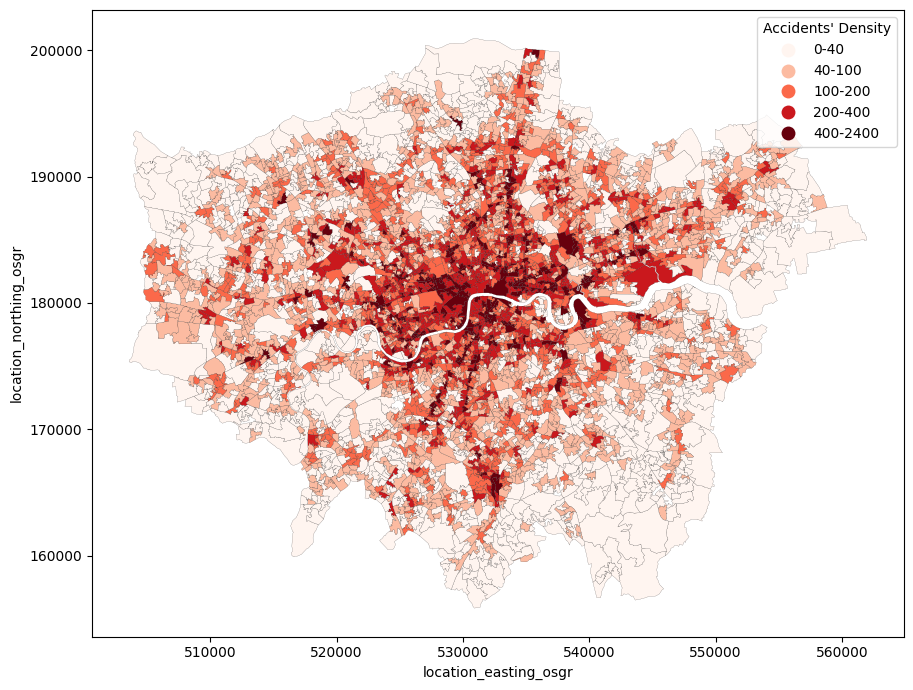

In [69]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Manually set classification thresholds
bins = [0, 40, 100, 200, 400, 2400]  # Define classification thresholds
labels = ['0-40', '40-100', '100-200', '200-400', '400-2400']  # Define labels

# Use pandas' cut function to create a new classified column
gdf['accident_bins'] = pd.cut(gdf['accident_density'], bins=bins, labels=labels, include_lowest=True)

fig, ax = plt.subplots(1, 1, figsize=(12, 7))

# Use the new classified column for plotting
gdf.plot(column='accident_bins', ax=ax, legend=True,
         cmap='Reds', 
         edgecolor='black', 
         linewidth=0.1)

# Add axis labels
ax.set_xlabel('location_easting_osgr')
ax.set_ylabel('location_northing_osgr')

# Set the legend title
ax.get_legend().set_title("Accidents' Density")

plt.tight_layout()
plt.savefig('Output/Accident_Density.png')
plt.show()


# 2 TABLES

In [70]:
casualty.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131166 entries, 0 to 131165
Data columns (total 42 columns):
 #   Column                                                               Non-Null Count   Dtype  
---  ------                                                               --------------   -----  
 0   accident_index                                                       131166 non-null  object 
 1   age_of_casualty                                                      131166 non-null  float64
 2   casualty_severity                                                    131166 non-null  int64  
 3   location_easting_osgr                                                131166 non-null  float64
 4   location_northing_osgr                                               131166 non-null  float64
 5   longitude                                                            131166 non-null  float64
 6   latitude                                                             131166 non-null  float6

In [71]:
casualty.columns

Index(['accident_index', 'age_of_casualty', 'casualty_severity',
       'location_easting_osgr', 'location_northing_osgr', 'longitude',
       'latitude', 'lsoa_of_accident_location', 'number_of_vehicles',
       'speed_limit', 'avg_age_of_vehicle', 'avg_age_of_driver',
       'Index of Multiple Deprivation (IMD) Score', 'distance_5km',
       'distance_5_10km', 'distance_20km', 'pop_density', 'bus_stop_count',
       'shops_count', 'casualty_class_Passenger', 'casualty_class_Pedestrian',
       'accident_severity_Serious', 'accident_severity_Slight',
       'road_type_Other', 'road_type_Single', 'day_of_week_Weekend',
       'first_road_class_B_Road', 'first_road_class_C_Road',
       'first_road_class_Motorway', 'first_road_class_Unclassified',
       'pedestrian_crossing_physical_facilities_Others',
       'pedestrian_crossing_physical_facilities_Zebra',
       'pedestrian_crossing_physical_facilities_pedestrian_light_controlled',
       'light_conditions_Night_time_light',
       '

In [72]:
continuous_vars = [
    'age_of_casualty','number_of_vehicles','speed_limit',
       'avg_age_of_vehicle', 'avg_age_of_driver',
       'Index of Multiple Deprivation (IMD) Score', 'pop_density',
       'bus_stop_count','shops_count','distance_5km',
       'distance_5_10km', 'distance_20km'
]

In [73]:
features = casualty[continuous_vars]

## 2.1 Descriptive statistical analysis: min, max, mean, median of each continuous variable

In [74]:
import pandas as pd
import numpy as np

# Calculate the required statistics for each continuous variable
stats = casualty[continuous_vars].agg(['min', 'max', 'mean', 'median', 'std']).transpose()

# Reset index to have the variable names as a column
stats.reset_index(inplace=True)
stats.rename(columns={'index': 'variable', 'std': 'std'}, inplace=True)

stats.to_csv('Output/Continuous.csv')
stats

,variable,min,max,mean,median,std
0,age_of_casualty,0.000000,98.000000,36.160564,34.000000,16.083810
1,number_of_vehicles,1.000000,13.000000,1.874381,2.000000,0.722163
2,speed_limit,20.000000,70.000000,28.396612,30.000000,8.175398
3,avg_age_of_vehicle,0.000000,118.000000,7.148446,6.881500,3.726216
4,avg_age_of_driver,10.000000,99.000000,38.765678,38.000000,10.272423
5,Index of Multiple Deprivation (IMD) Score,2.326000,64.677000,23.698155,23.491000,10.418190
6,pop_density,119.997014,69325.739715,8505.783918,7290.806508,5986.923785
7,bus_stop_count,0.000000,48.000000,0.980269,0.000000,2.395352
8,shops_count,0.000000,256.000000,3.081721,0.000000,7.884333
9,distance_5km,38.000000,555.000000,173.463321,165.000000,64.185148


## 2.2 The name, value, count, and percentage of each categorical variable

In [75]:
casualty0 = pd.read_csv('../london_traffic_accidents_alldata.csv')
casualty0

,accident_index,casualty_class,age_of_casualty,casualty_severity,location_easting_osgr,location_northing_osgr,longitude,latitude,lsoa_of_accident_location,accident_severity,...,junction_detail,avg_age_of_vehicle,avg_age_of_driver,Index of Multiple Deprivation (IMD) Score,distance_5km,distance_5_10km,distance_20km,pop_density,bus_stop_count,shops_count
0,2018010080971,Passenger,50.0,0,529150.0,182270.0,-0.139737,51.524587,E01000854,Slight,...,not_junction,5.500000,40.000000,15.832,194,63,24,12808.285966,4.0,14.0
1,2018010080971,Driver,48.0,0,529150.0,182270.0,-0.139737,51.524587,E01000854,Slight,...,not_junction,5.500000,40.000000,15.832,194,63,24,12808.285966,4.0,14.0
2,2018010080973,Pedestrian,29.0,0,542020.0,184290.0,0.046471,51.539651,E01003531,Slight,...,Roundabout,12.023995,38.693432,29.192,219,281,40,10028.302346,1.0,0.0
3,2018010080974,Driver,40.0,0,531720.0,182910.0,-0.102474,51.529746,E01002723,Slight,...,Cross_road,6.668333,30.500000,28.536,198,62,7,15854.305619,0.0,0.0
4,2018010080981,Driver,27.0,1,541450.0,183220.0,0.037828,51.530179,E01003492,Serious,...,Other_junction,4.040000,28.500000,24.941,205,259,51,20977.522762,0.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131161,2022481292382,Driver,62.0,1,531938.0,180948.0,-0.100093,51.512063,E01032739,Serious,...,not_junction,5.000000,62.000000,13.584,230,62,16,972.567785,0.0,0.0
131162,2022481292397,Driver,39.0,1,533151.0,181140.0,-0.082551,51.513504,E01032739,Serious,...,not_junction,4.429286,43.000000,13.584,230,62,16,972.567785,2.0,0.0
131163,2022481292410,Driver,58.0,0,532553.0,180786.0,-0.091297,51.510463,E01032739,Slight,...,T_junction,6.055000,41.500000,13.584,230,62,16,972.567785,0.0,0.0
131164,2022481292425,Pedestrian,26.0,1,533054.0,181236.0,-0.083912,51.514390,E01032739,Serious,...,T_junction,6.000000,63.000000,13.584,230,62,16,972.567785,1.0,1.0


In [76]:
casualty0.columns

Index(['accident_index', 'casualty_class', 'age_of_casualty',
       'casualty_severity', 'location_easting_osgr', 'location_northing_osgr',
       'longitude', 'latitude', 'lsoa_of_accident_location',
       'accident_severity', 'number_of_vehicles', 'day_of_week',
       'first_road_class', 'speed_limit', 'road_type',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'urban_or_rural_area', 'junction_detail',
       'avg_age_of_vehicle', 'avg_age_of_driver',
       'Index of Multiple Deprivation (IMD) Score', 'distance_5km',
       'distance_5_10km', 'distance_20km', 'pop_density', 'bus_stop_count',
       'shops_count'],
      dtype='object')

In [77]:
categorical_vars = ['casualty_severity','casualty_class', 
    'day_of_week', 'first_road_class', 'road_type',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'urban_or_rural_area', 'junction_detail'
]

In [78]:
result_df = pd.DataFrame(columns=['variable', 'value', 'count', 'percent'])

for var in categorical_vars:
    # Calculate the value counts and percentages for each variable
    count_series = casualty0[var].value_counts()
    percent_series = casualty0[var].value_counts(normalize=True) * 100
    temp_df = pd.DataFrame({
        'variable': var,
        'value': count_series.index,
        'count': count_series.values,
        'percent': percent_series.values
    })
    
    # 追加到结果 DataFrame 中
    result_df = pd.concat([result_df, temp_df], ignore_index=True)

result_df.to_csv('Output/Categorical.csv')
result_df

,variable,value,count,percent
0,casualty_severity,0,112096,85.461171
1,casualty_severity,1,19070,14.538829
2,casualty_class,Driver,86284,65.782291
3,casualty_class,Pedestrian,23124,17.629569
4,casualty_class,Passenger,21758,16.588140
5,day_of_week,Weekday,90908,69.307595
6,day_of_week,Weekend,40258,30.692405
7,first_road_class,A_Road,79615,60.697894
8,first_road_class,Unclassified,24239,18.479636
9,first_road_class,C_Road,15583,11.880365


## 2.3 casualties hexbin map

In [79]:
# Read the boundary file for London boroughs
london_boroughs = gpd.read_file("../statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp")

# Use unary_union to merge the boundaries of all boroughs
london_boundary = london_boroughs.geometry.unary_union

# Create a new GeoDataFrame to store the merged boundary
london_boundary_gdf = gpd.GeoDataFrame(geometry=[london_boundary], crs=london_boroughs.crs)

print(london_boundary_gdf)

                                            geometry
0  POLYGON ((528150.2 159979.2, 528100.9 160037.3...


In [80]:
# Convert the accident data into a GeoDataFrame
casualty['geometry'] = gpd.points_from_xy(casualty.location_easting_osgr, casualty.location_northing_osgr)
casualty = gpd.GeoDataFrame(casualty, geometry='geometry')

In [81]:
casualty_map = casualty.copy()

In [82]:
# Filtering serious and minor accident data
severe_cases = casualty_map[casualty_map['casualty_severity'] == 1]
non_severe_cases = casualty_map[casualty_map['casualty_severity'] == 0]

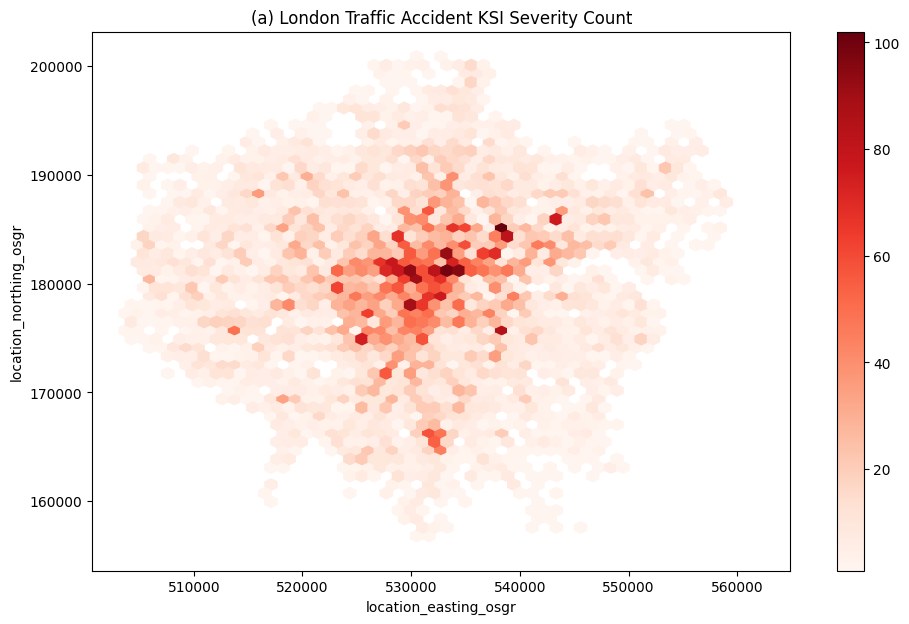

In [83]:
fig, ax = plt.subplots(1, 1, figsize=(12, 7))
london_boundary_gdf.plot(ax=ax, color='white', edgecolor='white')

severe_cases.plot(ax=ax, kind='hexbin', 
                  x='location_easting_osgr', y='location_northing_osgr', 
                  C='casualty_severity', 
                  reduce_C_function=np.sum, 
                  gridsize=50, cmap='Reds', 
                  # legend=True
             )

ax.set_title('(a) London Traffic Accident KSI Severity Count')

plt.show()

In [84]:
non_severe_cases['casualty_severity'] = 1
non_severe_cases

,accident_index,age_of_casualty,casualty_severity,location_easting_osgr,location_northing_osgr,longitude,latitude,lsoa_of_accident_location,number_of_vehicles,speed_limit,...,light_conditions_Night_time_light,light_conditions_Night_time_nolight,weather_conditions_Fog,weather_conditions_Raining/Snowing,urban_or_rural_area_Urban,junction_detail_Other_junction,junction_detail_Roundabout,junction_detail_T_junction,junction_detail_not_junction,geometry
0,2018010080971,50.0,1,529150.0,182270.0,-0.139737,51.524587,E01000854,2,30.0,...,1,0,0,0,1,0,0,0,1,POINT (529150 182270)
1,2018010080971,48.0,1,529150.0,182270.0,-0.139737,51.524587,E01000854,2,30.0,...,1,0,0,0,1,0,0,0,1,POINT (529150 182270)
2,2018010080973,29.0,1,542020.0,184290.0,0.046471,51.539651,E01003531,1,30.0,...,1,0,0,0,1,0,1,0,0,POINT (542020 184290)
3,2018010080974,40.0,1,531720.0,182910.0,-0.102474,51.529746,E01002723,2,20.0,...,1,0,0,0,1,0,0,0,0,POINT (531720 182910)
5,2018010080982,43.0,1,543580.0,176500.0,0.065781,51.469258,E01001682,2,30.0,...,1,0,0,0,1,0,0,0,1,POINT (543580 176500)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131155,2022481291915,31.0,1,532757.0,181029.0,-0.088268,51.512599,E01032739,1,20.0,...,1,0,0,0,1,0,0,1,0,POINT (532757 181029)
131156,2022481291919,29.0,1,532016.0,181806.0,-0.098649,51.519755,E01032740,2,20.0,...,0,0,0,0,1,0,0,0,1,POINT (532016 181806)
131157,2022481291921,41.0,1,532690.0,181813.0,-0.088938,51.519660,E01002704,1,20.0,...,0,0,0,0,1,0,0,1,0,POINT (532690 181813)
131160,2022481292373,46.0,1,532976.0,180959.0,-0.085140,51.511919,E01032739,2,20.0,...,1,0,0,0,1,0,0,0,0,POINT (532976 180959)


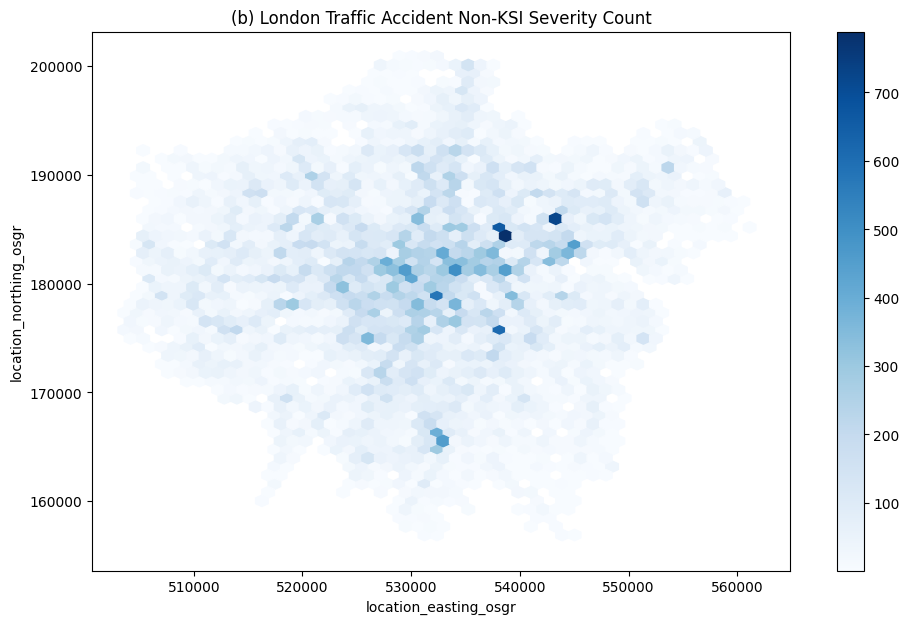

In [85]:
fig, ax = plt.subplots(1, 1, figsize=(12, 7))
london_boundary_gdf.plot(ax=ax, color='white', edgecolor='white')

non_severe_cases.plot(ax=ax, kind='hexbin', 
                  x='location_easting_osgr', y='location_northing_osgr', 
                  C='casualty_severity', 
                  reduce_C_function=np.sum, 
                  gridsize=50, cmap='Blues', 
                  # legend=True
             )

ax.set_title('(b) London Traffic Accident Non-KSI Severity Count')

plt.show()

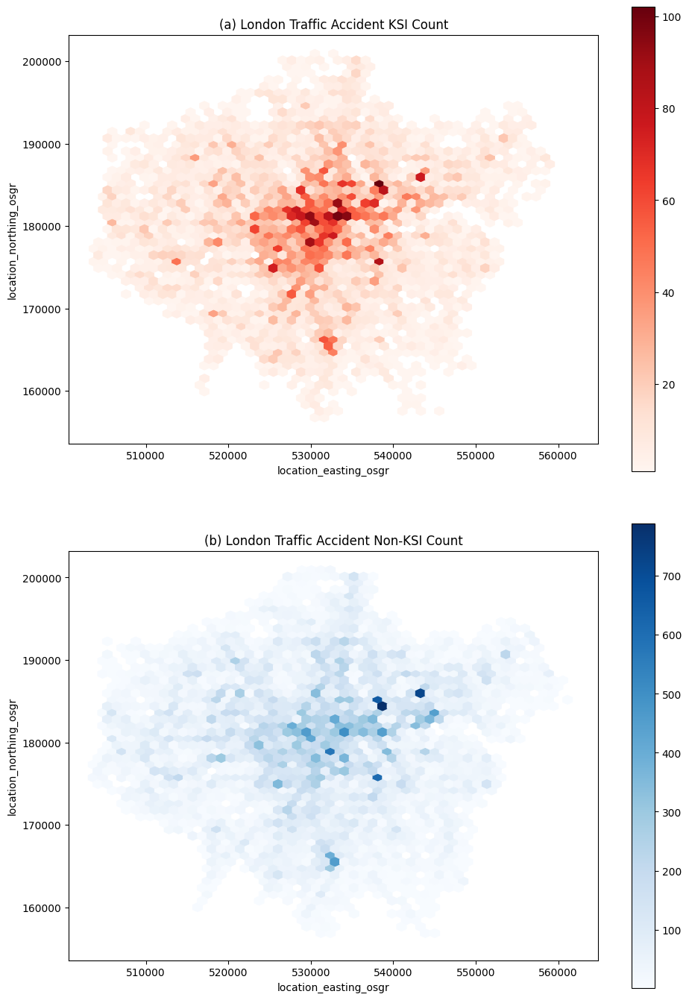

In [86]:
import matplotlib.pyplot as plt
import numpy as np

fig, axs = plt.subplots(2, 1, figsize=(10, 14))

# Plot the boundary and a hexbin map of severe accidents on the first subplot
london_boundary_gdf.plot(ax=axs[0], color='white', edgecolor='white')
severe_cases.plot(ax=axs[0], kind='hexbin', 
                  x='location_easting_osgr', y='location_northing_osgr', 
                  C='casualty_severity', 
                  reduce_C_function=np.sum, 
                  gridsize=50, cmap='Reds')

axs[0].set_title('(a) London Traffic Accident KSI Count')

# Plot the boundary and a hexbin map of non-severe accidents on the second subplot
london_boundary_gdf.plot(ax=axs[1], color='white', edgecolor='white')
non_severe_cases.plot(ax=axs[1], kind='hexbin', 
                      x='location_easting_osgr', y='location_northing_osgr', 
                      C='casualty_severity', 
                      reduce_C_function=np.sum, 
                      gridsize=50, cmap='Blues')

axs[1].set_title('(b) London Traffic Accident Non-KSI Count')
plt.tight_layout()
plt.savefig('Output/Hebin_map_2018-2022.png')

plt.show()

## 2.4 Drawing of serious and less serious situations

### Handling continuous variables

In [87]:
casualty[continuous_vars]

,age_of_casualty,number_of_vehicles,speed_limit,avg_age_of_vehicle,avg_age_of_driver,Index of Multiple Deprivation (IMD) Score,pop_density,bus_stop_count,shops_count,distance_5km,distance_5_10km,distance_20km
0,50.0,2,30.0,5.500000,40.000000,15.832,12808.285966,4.0,14.0,194,63,24
1,48.0,2,30.0,5.500000,40.000000,15.832,12808.285966,4.0,14.0,194,63,24
2,29.0,1,30.0,12.023995,38.693432,29.192,10028.302346,1.0,0.0,219,281,40
3,40.0,2,20.0,6.668333,30.500000,28.536,15854.305619,0.0,0.0,198,62,7
4,27.0,2,30.0,4.040000,28.500000,24.941,20977.522762,0.0,13.0,205,259,51
...,...,...,...,...,...,...,...,...,...,...,...,...
131161,62.0,1,20.0,5.000000,62.000000,13.584,972.567785,0.0,0.0,230,62,16
131162,39.0,2,20.0,4.429286,43.000000,13.584,972.567785,2.0,0.0,230,62,16
131163,58.0,2,20.0,6.055000,41.500000,13.584,972.567785,0.0,0.0,230,62,16
131164,26.0,1,20.0,6.000000,63.000000,13.584,972.567785,1.0,1.0,230,62,16


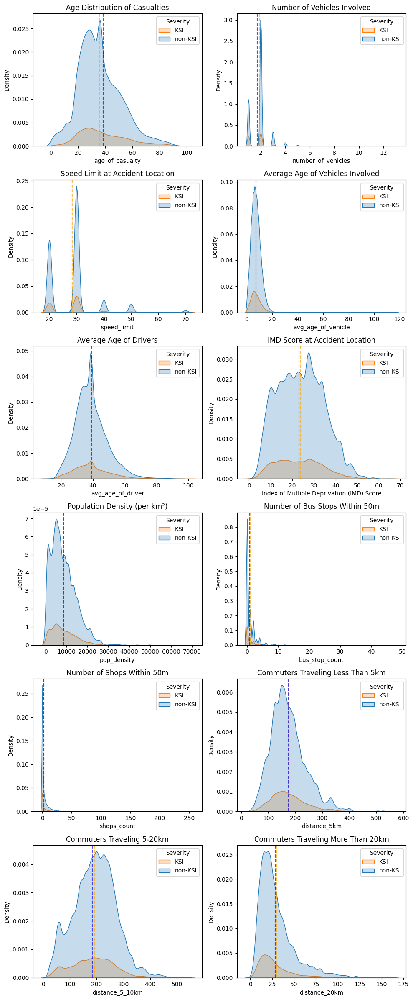

In [88]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

custom_titles = {
    'age_of_casualty': 'Age Distribution of Casualties',
    'number_of_vehicles': 'Number of Vehicles Involved',
    'speed_limit': 'Speed Limit at Accident Location',
    'avg_age_of_vehicle': 'Average Age of Vehicles Involved',
    'avg_age_of_driver': 'Average Age of Drivers',
    'Index of Multiple Deprivation (IMD) Score':'IMD Score at Accident Location', 
    'pop_density': 'Population Density (per km²)',
    'bus_stop_count': 'Number of Bus Stops Within 50m',
    'shops_count': 'Number of Shops Within 50m',
    'distance_5km': 'Commuters Traveling Less Than 5km',
    'distance_5_10km': 'Commuters Traveling 5-20km',
    'distance_20km': 'Commuters Traveling More Than 20km'
}

n_vars = len(continuous_vars)
n_rows = math.ceil(n_vars / 2)
fig, axes = plt.subplots(n_rows, 2, figsize=(10, 4*n_rows), sharex=False)

for i, var in enumerate(continuous_vars):
    row = i // 2
    col = i % 2
    ax = axes[row, col] if n_rows > 1 else axes[col]
    
    sns.kdeplot(data=casualty, x=var, hue='casualty_severity', shade=True, ax=ax)
    
    title = custom_titles.get(var, f'Distribution of {var}')
    ax.set_title(title, fontsize=12)
    
    ax.set_ylabel('Density', fontsize=10)
    ax.legend(['KSI', 'non-KSI'], title='Severity')
    
    for severity in [0, 1]:
        mean = casualty[casualty['casualty_severity'] == severity][var].mean()
        ax.axvline(mean, color=['orange', 'blue'][severity], linestyle='--', alpha=0.7)

if n_vars % 2 != 0:
    fig.delaxes(axes[-1, -1])

plt.tight_layout()
plt.savefig('Output/EDA2.png')
plt.show()

### Handling categorical variables

In [89]:
casualty0.columns

Index(['accident_index', 'casualty_class', 'age_of_casualty',
       'casualty_severity', 'location_easting_osgr', 'location_northing_osgr',
       'longitude', 'latitude', 'lsoa_of_accident_location',
       'accident_severity', 'number_of_vehicles', 'day_of_week',
       'first_road_class', 'speed_limit', 'road_type',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'urban_or_rural_area', 'junction_detail',
       'avg_age_of_vehicle', 'avg_age_of_driver',
       'Index of Multiple Deprivation (IMD) Score', 'distance_5km',
       'distance_5_10km', 'distance_20km', 'pop_density', 'bus_stop_count',
       'shops_count'],
      dtype='object')

In [94]:
casualty0.loc[casualty0['road_type'] == 'Other', 'road_type'] = 'Complex_interchanges'

In [95]:
categorical_vars

['casualty_severity',
 'casualty_class',
 'day_of_week',
 'first_road_class',
 'road_type',
 'pedestrian_crossing_physical_facilities',
 'light_conditions',
 'weather_conditions',
 'urban_or_rural_area',
 'junction_detail']

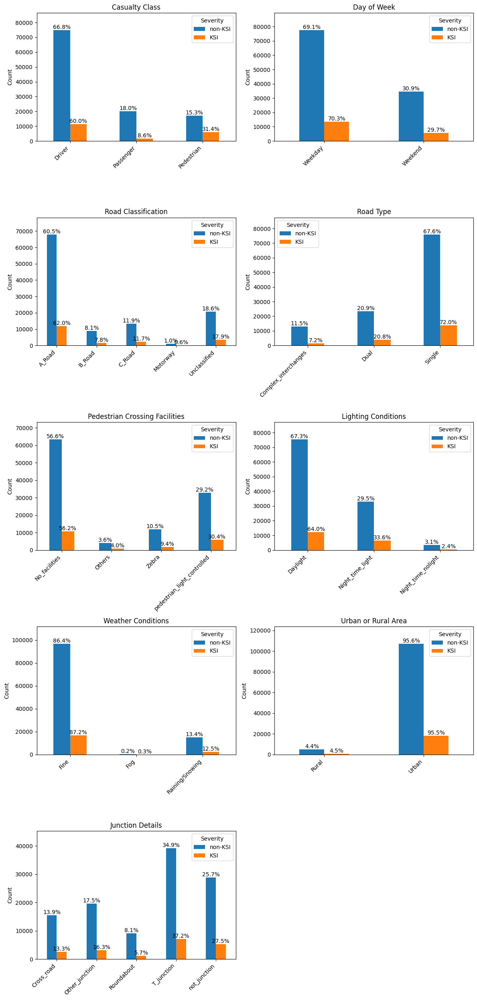

In [96]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math

custom_titles = {
    'casualty_class': 'Casualty Class',
    'day_of_week': 'Day of Week',
    'first_road_class': 'Road Classification',
    'road_type': 'Road Type',
    'pedestrian_crossing_physical_facilities': 'Pedestrian Crossing Facilities',
    'light_conditions': 'Lighting Conditions',
    'weather_conditions': 'Weather Conditions',
    'urban_or_rural_area': 'Urban or Rural Area',
    'junction_detail': 'Junction Details'
}

if 'casualty_severity' in categorical_vars:
    categorical_vars.remove('casualty_severity')

n_rows = math.ceil(len(categorical_vars) / 2)

fig, axes = plt.subplots(n_rows, 2, figsize=(12, 5*n_rows), squeeze=False)

for i, var in enumerate(categorical_vars):
    row = i // 2
    col = i % 2
    ax = axes[row, col]

    cross_tab = pd.crosstab(casualty0[var], casualty0['casualty_severity'])
    cross_tab_percent = cross_tab.div(cross_tab.sum(axis=0), axis=1) * 100
    cross_tab.plot(kind='bar', ax=ax)
    

    ax.set_title(custom_titles.get(var, var))
    ax.set_xlabel('')
    ax.set_ylabel('Count')
    ax.legend(['non-KSI', 'KSI'],title='Severity')
    

    for j, c in enumerate(ax.containers):
        labels = [f'{cross_tab_percent.iloc[idx, j]:.1f}%' for idx in range(len(c))]
        ax.bar_label(c, labels=labels, label_type='edge')
        
    ax.set_ylim(0, ax.get_ylim()[1] * 1.1)
    
    ax.tick_params(axis='x', rotation=45)
    ax.set_xticklabels(ax.get_xticklabels(), ha='right')

if len(categorical_vars) % 2 != 0:
    fig.delaxes(axes[-1, -1])

plt.tight_layout()
plt.savefig('Output/EDA.png')
plt.show()

# 3 Random Forest Feature Selection

In [42]:
casualty.columns

Index(['accident_index', 'age_of_casualty', 'casualty_severity',
       'location_easting_osgr', 'location_northing_osgr', 'longitude',
       'latitude', 'lsoa_of_accident_location', 'number_of_vehicles',
       'speed_limit', 'avg_age_of_vehicle', 'avg_age_of_driver',
       'Index of Multiple Deprivation (IMD) Score', 'distance_5km',
       'distance_5_10km', 'distance_20km', 'pop_density', 'bus_stop_count',
       'shops_count', 'casualty_class_Passenger', 'casualty_class_Pedestrian',
       'accident_severity_Serious', 'accident_severity_Slight',
       'road_type_Other', 'road_type_Single', 'day_of_week_Weekend',
       'first_road_class_B_Road', 'first_road_class_C_Road',
       'first_road_class_Motorway', 'first_road_class_Unclassified',
       'pedestrian_crossing_physical_facilities_Others',
       'pedestrian_crossing_physical_facilities_Zebra',
       'pedestrian_crossing_physical_facilities_pedestrian_light_controlled',
       'light_conditions_Night_time_light',
       '

In [99]:
columns_to_drop = ['accident_index', 'location_easting_osgr', 'location_northing_osgr', 
                   'longitude', 'latitude', 'lsoa_of_accident_location', 
                   'accident_severity_Slight','accident_severity_Serious',"geometry"
                  ]
casualty1 = casualty.drop(columns=columns_to_drop)

In [100]:
import geopandas as gpd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Define feature columns and the target column
target = 'casualty_severity'
features = [col for col in casualty1.columns if col != target]

# Split the dataset
X = casualty1[features]
y = casualty1[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train the Random Forest model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Predict and evaluate the model
y_pred = rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy of the model:", accuracy)

# Get and print feature importances
importances = rf.feature_importances_
feature_importance = sorted(zip(features, importances), key=lambda x: x[1], reverse=True)

print("Feature importances:")
for feature, importance in feature_importance:
    print(f"{feature}: {importance}")


Accuracy of the model: 0.8589834815756036
Feature importances:
age_of_casualty: 0.10741709529377999
avg_age_of_vehicle: 0.09491939251579948
avg_age_of_driver: 0.0941594403758166
Index of Multiple Deprivation (IMD) Score: 0.08697244045178419
pop_density: 0.08661735861440084
distance_5_10km: 0.08081226610998289
distance_5km: 0.08046529314561432
distance_20km: 0.07087124939366327
shops_count: 0.04356770907082892
bus_stop_count: 0.030884907866999715
speed_limit: 0.023196520970034898
number_of_vehicles: 0.01970503729344838
day_of_week_Weekend: 0.01640169780373374
casualty_class_Pedestrian: 0.015340364165592327
pedestrian_crossing_physical_facilities_pedestrian_light_controlled: 0.013773529395139227
junction_detail_T_junction: 0.013664631305234922
light_conditions_Night_time_light: 0.013097160849190126
junction_detail_not_junction: 0.012031653558696969
road_type_Single: 0.010852261686810078
first_road_class_Unclassified: 0.010662874533549232
junction_detail_Other_junction: 0.0105788808209938

In [101]:
# MDA
import numpy as np
from sklearn.metrics import accuracy_score

# Define feature columns and the target column
target = 'casualty_severity'
features = [col for col in casualty1.columns if col != target]

# Split the dataset
X = casualty1[features]
y = casualty1[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train the baseline model
rf = RandomForestClassifier(n_estimators=10, random_state=42)
rf.fit(X_train, y_train)
baseline_accuracy = accuracy_score(y_test, rf.predict(X_test))

# Initialize a dictionary to store feature importance scores
importance_scores = {feature: [] for feature in features}

# Evaluate the importance of each feature
n_iterations = 10  # Adjust the number of iterations to get more stable estimates
for feature in features:
    for _ in range(n_iterations):
        # Shuffle the feature values
        X_test_shuffled = X_test.copy()
        X_test_shuffled[feature] = np.random.permutation(X_test_shuffled[feature].values)
        
        # Evaluate accuracy
        shuffled_accuracy = accuracy_score(y_test, rf.predict(X_test_shuffled))
        decrease = baseline_accuracy - shuffled_accuracy
        
        # Record the accuracy decrease
        importance_scores[feature].append(decrease)

# Calculate the average decrease in accuracy
average_decreases = {feature: np.mean(decreases) for feature, decreases in importance_scores.items()}

# Print the results
sorted_importances = sorted(average_decreases.items(), key=lambda x: x[1], reverse=True)
for feature, importance in sorted_importances:
    print(f"{feature}: {importance}")


number_of_vehicles: 0.003809402795425643
casualty_class_Pedestrian: 0.003768742058449781
age_of_casualty: 0.0035120711562896976
avg_age_of_driver: 0.00227445997458704
pop_density: 0.0015324015247776047
avg_age_of_vehicle: 0.0014891994917407337
bus_stop_count: 0.0011664548919949169
casualty_class_Passenger: 0.001156289707750935
Index of Multiple Deprivation (IMD) Score: 0.0008767471410419114
speed_limit: 0.0008310038119440754
light_conditions_Night_time_light: 0.0007369758576874164
pedestrian_crossing_physical_facilities_pedestrian_light_controlled: 0.0007191867852604616
shops_count: 0.0006937738246505565
urban_or_rural_area_Urban: 0.0006277001270647786
first_road_class_Unclassified: 0.00044218551461242537
day_of_week_Weekend: 0.000381194409148633
distance_5_10km: 0.0003252858958068372
junction_detail_T_junction: 0.00031766200762388673
junction_detail_Other_junction: 0.0002846251588309756
road_type_Single: 0.00024396442185513622
weather_conditions_Raining/Snowing: 0.00016264294790342416

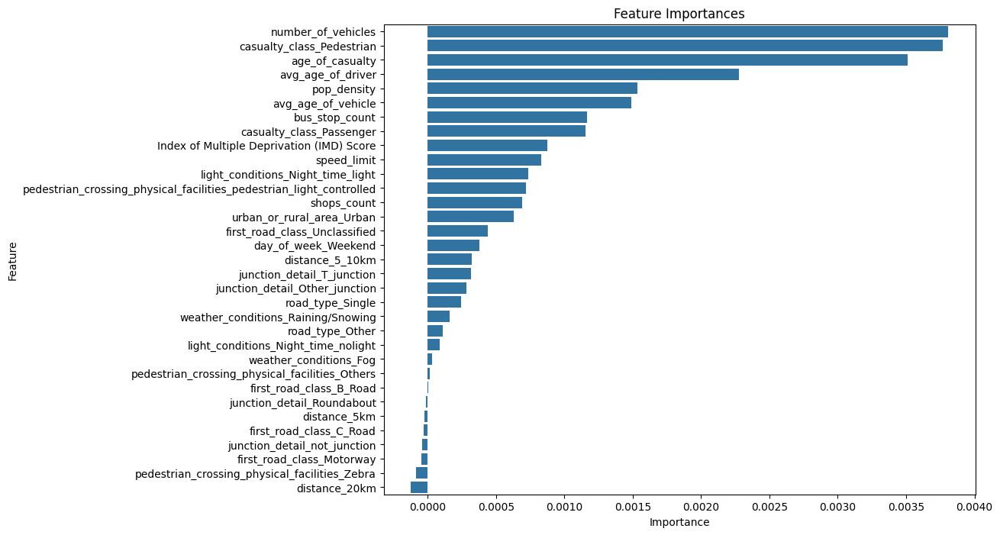

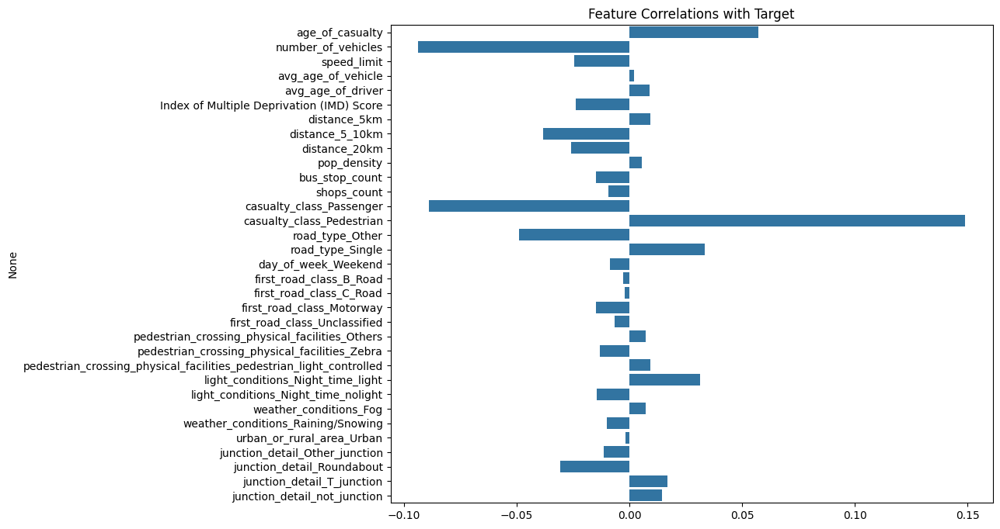

In [102]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation between features and the target variable
correlations = casualty1[features + [target]].corr()[target].drop(target)

# Visualize feature importance
feature_importances = pd.DataFrame(sorted_importances, columns=['Feature', 'Importance'])
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importances)
plt.title('Feature Importances')
plt.show()

# Visualize feature correlations with the target variable
plt.figure(figsize=(10, 8))
sns.barplot(x=correlations.values, y=correlations.index)
plt.title('Feature Correlations with Target')
plt.show()


# 4 Data processing

### Multicollinearity analysis

In [ ]:
casualty_features = ['age_of_casualty', 'casualty_severity', 'number_of_vehicles',
       'speed_limit', 'avg_age_of_vehicle', 'avg_age_of_driver',
       'Index of Multiple Deprivation (IMD) Score', 'distance_5km',
       'distance_5_10km', 'distance_20km', 'pop_density', 'bus_stop_count',
       'shops_count', 'casualty_class_Passenger', 'casualty_class_Pedestrian',
       'road_type_Other', 'road_type_Singel', 'day_of_week_Weekend',
       'first_road_class_B', 'first_road_class_C', 'first_road_class_Motorway',
       'first_road_class_Unclassified',
       'pedestrian_crossing_physical_facilities_Others',
       'pedestrian_crossing_physical_facilities_Zebra',
       'pedestrian_crossing_physical_facilities_pedestrian_light_controlled',
       'light_conditions_Night_time_light',
       'light_conditions_Night_time_nolight', 'weather_conditions_Fog',
       'weather_conditions_Raining/Snowing', 'urban_or_rural_area_Urban',
       'junction_detail_Other_junction', 'junction_detail_Roundabout',
       'junction_detail_T_junction', 'junction_detail_not_junction']

In [ ]:
casualty_features = casualty[casualty_features]

In [ ]:
casualty_features.info()

In [ ]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

X = casualty_features.drop(columns=['casualty_severity'])
# Add a constant term because VIF calculation requires it
X = add_constant(X)

vif_data = pd.DataFrame()
vif_data["feature"] = X.columns

# Calculate the VIF value for each variable
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Print the VIF values
print(vif_data)
vif_data.to_csv('Output/vif.csv')

In [ ]:
counts = casualty['casualty_severity'].value_counts()

counts_df = counts.reset_index()
counts_df.columns = ['Casualty Severity', 'Count']
counts_df['Percentage'] = (counts_df['Count'] / counts_df['Count'].sum()) * 100

print(counts_df)
counts_df.to_csv('Output/KSIpersent.csv')

### Normalization

In [ ]:
casualty_nor = df_downsampled.copy()

In [ ]:
# Normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler

continuous_vars = [
    'age_of_casualty','number_of_vehicles',
       'avg_age_of_vehicle', 'avg_age_of_driver',
       'Index of Multiple Deprivation (IMD) Score', 'pop_density',
       'bus_stop_count','speed_limit',
    'distance_5km','distance_5_10km', 'distance_20km'
]

features = casualty_nor[continuous_vars]

scaler = MinMaxScaler()

casualty_nor[continuous_vars] = scaler.fit_transform(features)

In [ ]:
casualty_nor

In [ ]:
casualty_nor.columns

In [ ]:
casualty_nor.to_csv('london_casualty_nor.csv', index=False)

In [ ]:
import pandas as pd
from sklearn.utils import resample


# 分离多数和少数类
df_majority = casualty[casualty.casualty_severity != 1]
df_minority = casualty[casualty.casualty_severity == 1]

# 随机欠采样多数类
df_majority_downsampled = resample(df_majority, 
                                   replace=False,    # 不进行替换
                                   n_samples=len(df_minority),  # 与少数类相匹配的样本数
                                   random_state=123) # 可复现的随机种子

# 合并少数类与下采样后的多数类
df_downsampled = pd.concat([df_majority_downsampled, df_minority])

# 显示新的类分布
print(df_downsampled.casualty_severity.value_counts())

In [ ]:
# 归一化
from sklearn.preprocessing import StandardScaler, MinMaxScaler

continuous_vars = [
    'age_of_casualty','number_of_vehicles',
       'avg_age_of_vehicle', 'avg_age_of_driver',
       'Index of Multiple Deprivation (IMD) Score', 'pop_density',
       'bus_stop_count','speed_limit',
    'distance_5km','distance_5_10km', 'distance_20km'
]
casualty_new = casualty.copy()
# 从数据框中选取这些连续变量
features = casualty_new[continuous_vars]

# 实例化 MinMaxScaler
scaler = MinMaxScaler()

casualty_new[continuous_vars] = scaler.fit_transform(features)

In [ ]:
# 定义特征列和目标列
target = 'casualty_severity'
features = [col for col in casualty_new.columns if col != target]

# 分割数据集
X = casualty_new[features]
y = casualty_new[target]

In [ ]:
####保留！！没有筛选过数据的
#运用过采样和少数类权重调整
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# 分割数据集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

train_df = pd.concat([X_train,y_train],axis=1)

In [ ]:
test_df = pd.concat([X_test,y_test],axis=1)

In [ ]:
test_df_0 = test_df[test_df['casualty_severity'] != 1]
test_df_1 = test_df[test_df['casualty_severity'] == 1]

In [ ]:
test_df_0_sample = test_df_0.sample(1898,random_state=42)

In [ ]:
test_df_new = pd.concat([test_df_0_sample,test_df_1])

In [ ]:
X_test = test_df_new[seleted_features]
y_test = test_df_new['casualty_severity']

In [ ]:


# # 实例化SMOTE对象
# smote = SMOTE(sampling_strategy='auto', k_neighbors=5, random_state=42, n_jobs=-1)
# X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# # 应用SMOTE
# smote = SMOTE(random_state=42)
# X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)



# 分离多数和少数类
df_majority = train_df[train_df.casualty_severity != 1]
df_minority = train_df[train_df.casualty_severity == 1]

# 随机欠采样多数类
df_majority_downsampled = resample(df_majority, 
                                   replace=False,    # 不进行替换
                                   n_samples=len(df_minority),  # 与少数类相匹配的样本数
                                   random_state=123) # 可复现的随机种子

# 合并少数类与下采样后的多数类
df_downsampled = pd.concat([df_majority_downsampled, df_minority])
df_downsampled = df_downsampled.sample(frac=1.0)
# 显示新的类分布
print(df_downsampled.casualty_severity.value_counts())



In [ ]:
# 删除不需要的列
columns_to_drop = ['accident_index', 'location_easting_osgr', 'location_northing_osgr', 
                   'longitude', 'latitude', 'lsoa_of_accident_location', 
                   'accident_severity_Slight','accident_severity_Serious'
                  ]
casualty1 = df_downsampled.drop(columns=columns_to_drop)

In [ ]:
seleted_features = [
'casualty_class_Pedestrian',
'age_of_casualty',
'number_of_vehicles',
'avg_age_of_driver',
'avg_age_of_vehicle',
'bus_stop_count',
'pop_density',
'casualty_class_Passenger',
'Index of Multiple Deprivation (IMD) Score',
'speed_limit',
'light_conditions_Night_time_light',
'pedestrian_crossing_physical_facilities_pedestrian_light_controlled',
'shops_count',
'urban_or_rural_area_Urban',
'first_road_class_Unclassified',
'day_of_week_Weekend',
'road_type_Singel',
'distance_5_10km',
'junction_detail_Other_junction',
'weather_conditions_Raining/Snowing',
'road_type_Other',
'junction_detail_T_junction'
]

In [ ]:
X_train_downsampled = casualty1[seleted_features]

In [ ]:
X_test = X_test[seleted_features]

In [ ]:
y_train_downsampled = casualty1['casualty_severity']

In [ ]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# 构建XGBoost模型
model = xgb.XGBClassifier(scale_pos_weight=1.01, use_label_encoder=False, eval_metric='logloss')

# 训练模型
model.fit(X_train_smote, y_train_smote)

# 预测测试数据
y_pred = model.predict(X_test)

# 评估模型
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))


In [ ]:
from sklearn.model_selection import GridSearchCV

# 定义参数网格
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# 使用网格搜索寻找最佳参数
grid_search = GridSearchCV(
    estimator=xgb.XGBClassifier(scale_pos_weight=1.01, use_label_encoder=False, eval_metric='logloss'),
    param_grid=param_grid,
    scoring='accuracy',
    cv=3,
    verbose=1,
    n_jobs=1
)

grid_search.fit(X_train_downsampled, y_train_downsampled)

# 输出最佳参数
print("Best parameters found: ", grid_search.best_params_)

# 使用最佳参数训练模型
best_model = grid_search.best_estimator_
best_model.fit(X_train_downsampled, y_train_downsampled)

# 预测测试数据
y_pred = best_model.predict(X_test)

# 评估模型
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))


In [ ]:
# 现在可以用X_train_smote, y_train_smote来训练模型
class_weights = {0: 1, 1: 1.01}  # 可以根据实验结果调整权重
# 构建逻辑回归模型
model = LogisticRegression(class_weight=class_weights,max_iter=200) # 增加迭代次数以确保收敛
model.fit(X_train_downsampled, y_train_downsampled)

# 预测测试数据
y_pred = model.predict(X_test)

# 评估模型
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

In [ ]:
# 创建SVM模型
svm_model = SVC(kernel='linear', class_weight='balanced', C=1.0, random_state=42)  # 也可以尝试其他核函数如'rbf'

# 训练模型
svm_model.fit(X_train_downsampled, y_train_downsampled)

# 进行预测
y_pred = svm_model.predict(X_test)

# 性能评估
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

In [ ]:
#运用过采样和少数类权重调整
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# 分割数据集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 实例化SMOTE对象
smote = SMOTE(sampling_strategy='auto', k_neighbors=5, random_state=42, n_jobs=-1)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# 应用SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# 现在可以用X_train_smote, y_train_smote来训练模型
# class_weights = {0: 1, 1: 2}  # 可以根据实验结果调整权重
# 构建逻辑回归模型
model = LogisticRegression(class_weight='balanced', max_iter=1000) # 增加迭代次数以确保收敛
model.fit(X_train_smote, y_train_smote)

# 预测测试数据
y_pred = model.predict(X_test)

# 评估模型
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

分类报告
Precision（精确度）：

对于类别0（不严重）：1.00。这意味着几乎所有预测为不严重的预测都是正确的。
对于类别1（严重）：0.87。这表示有87%的预测为严重的预测确实是正确的，有13%是错误的。
Recall（召回率）：

对于类别0：0.98。这意味着模型能够识别出98%的实际不严重的案例。
对于类别1：0.98。这表示模型成功识别了98%的实际严重的案例。
F1-Score（F1分数）：

对于类别0：0.99。F1分数是精确度和召回率的调和平均，高F1分数表明精确度和召回率之间达到了良好的平衡。
对于类别1：0.92。同样地，这个分数表明精确度和召回率对于严重事故的预测也是较为平衡的。
Accuracy（准确率）：0.98。整体上，模型正确预测了98%的案例，无论是严重还是不严重。

Macro Avg（宏观平均）：精确度0.94、召回率0.98和F1分数0.96。这些宏观平均值不考虑每个类别的样本数量，为所有类别提供了相等的权重。

Weighted Avg（加权平均）：精确度0.98、召回率0.98和F1分数0.98。这些加权平均值考虑了每个类别的样本量，提供了一个根据样本分布加权的性能评估。

混淆矩阵
左上（True Negative, TN）：24270。表示实际不严重且预测也为不严重的案例数量。
右上（False Positive, FP）：601。表示实际不严重但错误预测为严重的案例数量。
左下（False Negative, FN）：82。表示实际严重但错误预测为不严重的案例数量。
右下（True Positive, TP）：4182。表示实际严重且预测也为严重的案例数量。

In [ ]:
seleted_features = [
'casualty_class_Pedestrian',
'age_of_casualty',
'number_of_vehicles',
'avg_age_of_driver',
'avg_age_of_vehicle',
'bus_stop_count',
'pop_density',
'casualty_class_Passenger',
'Index of Multiple Deprivation (IMD) Score',
'speed_limit',
'light_conditions_Night_time_light',
'pedestrian_crossing_physical_facilities_pedestrian_light_controlled',
'shops_count',
'urban_or_rural_area_Urban',
'first_road_class_Unclassified',
'day_of_week_Weekend',
'road_type_Singel',
'distance_5_10km',
'junction_detail_Other_junction',
'weather_conditions_Raining/Snowing',
'road_type_Other',
'junction_detail_T_junction'
]

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

#运用过采样和少数类权重调整
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# 定义特征列和目标列
target = 'casualty_severity'
features = seleted_features

# 分割数据集
X = casualty_nor[features]
y = casualty_nor[target]

# 分割数据集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 实例化SMOTE对象
smote = SMOTE(sampling_strategy='auto', k_neighbors=5, random_state=42, n_jobs=-1)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# 应用SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# 现在可以用X_train_smote, y_train_smote来训练模型

# 构建逻辑回归模型
model = LogisticRegression(class_weight='balanced', max_iter=100) # 增加迭代次数以确保收敛
model.fit(X_train_smote, y_train_smote)

# 预测测试数据
y_pred = model.predict(X_test)

# 评估模型
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

In [ ]:
X_train_smote[X_train_smote['casualty_class_Pedestrian']==1]

In [ ]:
import matplotlib.pyplot as plt

# 预测概率
y_pred_prob = model.predict_proba(X_test)[:, 1]  # 获取正类的预测概率

# 绘制正类的预测概率直方图
plt.hist(y_pred_prob, bins=50, alpha=0.75, label='Class 1 Probabilities')
plt.xlabel('Predicted Probability of Class 1')
plt.ylabel('Frequency')
plt.title('Histogram of Predicted Probabilities')
plt.legend()
plt.show()


In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# 获取测试集的预测概率
y_scores = model.predict_proba(X_test)[:, 1]  # 取出属于正类的概率

# 计算ROC曲线的FPR, TPR, 和阈值
fpr, tpr, thresholds = roc_curve(y_test, y_scores)

# 计算AUC值
roc_auc = auc(fpr, tpr)

# 绘制ROC曲线
plt.figure(figsize=(10, 7))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# 预测测试数据
y_pred = model.predict(X_test)

# 计算混淆矩阵
cm = confusion_matrix(y_test, y_pred)

# 使用seaborn绘制混淆矩阵热图
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Severe', 'Severe'], yticklabels=['Non-Severe', 'Severe'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix Heatmap')
plt.show()


In [ ]:
#MDA SELETED FEATURES
seleted_features = [
# 'accident_severity_Slight',
'casualty_class_Passenger',
# 'age_of_casualty',
'casualty_class_Pedestrian',
'bus_stop_count',
'number_of_vehicles',
'junction_detail_not_junction',
# 'avg_age_of_driver',
'pedestrian_crossing_physical_facilities_Others',
'speed_limit',
'road_type_Singel',
'light_conditions_Night_time_light',
'day_of_week_Weekend'
]

In [ ]:
#运用过采样和少数类权重调整
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# 定义特征列和目标列
target = 'casualty_severity'
features = seleted_features

# 分割数据集
X = casualty_nor[features]
y = casualty_nor[target]

# 分割数据集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 实例化SMOTE对象
smote = SMOTE(sampling_strategy='auto', k_neighbors=5, random_state=42, n_jobs=-1)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# 应用SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# 现在可以用X_train_smote, y_train_smote来训练模型

# 构建逻辑回归模型
model = LogisticRegression(class_weight='balanced', max_iter=100) # 增加迭代次数以确保收敛
model.fit(X_train_smote, y_train_smote)

# 预测测试数据
y_pred = model.predict(X_test)

# 评估模型
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

In [ ]:
#MDA SELETED FEATURES
seleted_features = [
# 'accident_severity_Slight',
'casualty_class_Passenger',
# 'age_of_casualty',
'casualty_class_Pedestrian',
'bus_stop_count',
'number_of_vehicles',
'junction_detail_not_junction',
# 'avg_age_of_driver',
'pedestrian_crossing_physical_facilities_Others'
]

In [ ]:
#运用过采样和少数类权重调整
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# 定义特征列和目标列
target = 'casualty_severity'
features = seleted_features

# 分割数据集
X = casualty_nor[features]
y = casualty_nor[target]

# 分割数据集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 实例化SMOTE对象
smote = SMOTE(sampling_strategy='auto', k_neighbors=5, random_state=42, n_jobs=-1)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# 应用SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# 现在可以用X_train_smote, y_train_smote来训练模型

# 构建逻辑回归模型
model = LogisticRegression(class_weight='balanced', max_iter=100) # 增加迭代次数以确保收敛
model.fit(X_train_smote, y_train_smote)

# 预测测试数据
y_pred = model.predict(X_test)

# 评估模型
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

In [ ]:
#SELETED FEATURES
seleted_features2 = [
'accident_severity_Slight',
'accident_severity_Serious',
'age_of_casualty',
'Index of Multiple Deprivation (IMD) Score',
'pop_density',
'avg_age_of_driver',
'avg_age_of_vehicle',
'bus_stop_count',
'number_of_vehicles',
'casualty_class_Passenge'
]

In [ ]:
#运用过采样和少数类权重调整
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# 定义特征列和目标列
target = 'casualty_severity'
features = seleted_features2

# 分割数据集
X = casualty_nor[features]
y = casualty_nor[target]

# 分割数据集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 实例化SMOTE对象
smote = SMOTE(sampling_strategy='auto', k_neighbors=5, random_state=42, n_jobs=-1)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# 应用SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# 现在可以用X_train_smote, y_train_smote来训练模型

# 构建逻辑回归模型
model = LogisticRegression(class_weight='balanced', max_iter=1000) # 增加迭代次数以确保收敛
model.fit(X_train_smote, y_train_smote)

# 预测测试数据
y_pred = model.predict(X_test)

# 评估模型
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

In [ ]:
# 归一化
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# 从数据框中选取这些连续变量
features = casualty[continuous_vars]

# 实例化 MinMaxScaler
scaler = MinMaxScaler()

# 归一化这些特征
features_normalized = scaler.fit_transform(features)

# 将归一化后的数据转换成新的数据框
df_normalized = pd.DataFrame(features_normalized, columns=continuous_vars)

In [ ]:
df_normalized

In [ ]:
# 设置图形的大小
plt.figure(figsize=(20, 12))
sns.set(style="whitegrid")

# 使用subplot来组织图形
for i, var in enumerate(continuous_vars):
    plt.subplot(2, 4, i + 1)  # 两排，每排四个图
    sns.boxplot(y= casualty[var])
#    plt.ylim(casualty[var].quantile(0.01), casualty[var].quantile(0.99))  # 只显示1%到99%的数据
    plt.title(f'Boxplot of {var}')

plt.tight_layout()  # 调整每个子图的间距
plt.show()

In [ ]:
plt.figure(figsize=(20, 12))
for i, var in enumerate(continuous_vars):
    plt.subplot(2, 4, i + 1)
    # 应用对数转换
    sns.boxplot(y=np.log1p(casualty[var]))
    plt.title(f'Log-Transformed Boxplot of {var}')
plt.tight_layout()
plt.show()


In [ ]:
# 示例中假设 df 是你的数据集，'outcome' 是二元因变量
X = features[['age_of_casualty', 'number_of_vehicles', 'avg_age_of_vehicle', 'Index of Multiple Deprivation (IMD) Score', 'pop_density', 'bus_stop_count']]  # 根据VIF分析可能已经移除了 'avg_age_of_driver'
y = casualty['casualty_severity']

In [ ]:
from sklearn.model_selection import train_test_split

# 分割数据集，通常使用70%的数据作为训练集，30%作为测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [ ]:
from sklearn.linear_model import LogisticRegression

# 实例化逻辑回归模型
model = LogisticRegression()

# 训练模型
model.fit(X_train, y_train)


In [ ]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

# 预测测试集
y_pred = model.predict(X_test)

# 计算各种评估指标
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'Recall: {recall}')
print(f'Precision: {precision}')
print(f'F1 Score: {f1}')


In [ ]:
feature_names = X.columns
coefficients = model.coef_[0]
features_coefficients = pd.DataFrame(data = coefficients, index = feature_names, columns=['Coefficient'])

print(features_coefficients.sort_values(by='Coefficient', ascending=False))

In [ ]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# 计算精确度-召回率曲线
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)

# 绘制精确度-召回率曲线
plt.figure(figsize=(8, 5))
plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
plt.xlabel("Threshold")
plt.legend(loc="best")
plt.ylim([0, 1])
plt.show()

# 找到精确度和召回率平衡的阈值
index = np.argmax(precisions + recalls)
best_threshold = thresholds[index]
print("Best Threshold:", best_threshold)


In [ ]:
# 使用最佳阈值生成新的预测标签
y_pred_optimal = (y_pred_proba >= best_threshold).astype(int)

# 重新评估模型性能
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test, y_pred_optimal))
conf_matrix = confusion_matrix(y_test, y_pred_optimal)
print("Confusion Matrix:\n", conf_matrix)


In [ ]:
casualty.columns

In [ ]:
categorical_vars = [
        'casualty_class_Passenge',
       'casualty_class_Pedestrian', 'day_of_week_Weekend',
       'first_road_class_B', 'first_road_class_C', 'first_road_class_Motorway',
       'first_road_class_Unclassified', 'speed_limit_30.0', 'speed_limit_40.0',
       'speed_limit_50.0', 'speed_limit_60.0', 'speed_limit_70.0',
       'pedestrian_crossing_physical_facilities_Others',
       'pedestrian_crossing_physical_facilities_Zebra',
       'pedestrian_crossing_physical_facilities_pedestrian_light-controlled',
       'light_conditions_Night_time', 'weather_conditions_Fog',
       'weather_conditions_Raining/Snowing', 'urban_or_rural_area_Urban',
       'junction_detail_Other_junction'
]

In [ ]:
from scipy.stats import chi2_contingency
# 对每个分类变量执行卡方检验
results = {}
for var in categorical_vars:
    contingency_table = pd.crosstab(casualty[var], casualty['casualty_severity'])
    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    results[var] = {'chi2': chi2, 'p_value': p_value}

# 输出结果
results_df = pd.DataFrame(results).T
print(results_df)

不显著变量（p-value >= 0.05）:

day_of_week_Weekend, first_road_class_B, first_road_class_C: p-value 较高，可以考虑排除。

speed_limit_30.0, speed_limit_60.0, speed_limit_70.0: 高 p-value，考虑排除。

pedestrian_crossing_physical_facilities_Others: p-value 较高，考虑排除。

weather_conditions_Fog, urban_or_rural_area_Urban: p-value 较高，考虑排除。

In [ ]:
casualty

In [ ]:
# Use histogram to check the feature variables 

# Set the style of seaborn plot
sns.set(style="whitegrid")

# Function to create a set of distplots
def create_distplots(data_frame, column_names, rows, cols, fig_width, fig_height):
    fig, axes = plt.subplots(rows, cols, figsize=(fig_width, fig_height))
    axes = axes.flatten()  # Flatten the axes array for iteration

    for i, col_name in enumerate(column_names):
        sns.distplot(data_frame[col_name], bins=60, ax=axes[i])
        axes[i].set_title(col_name)

    plt.tight_layout()
    plt.show()

# Variables list
numeric_columns = ['casualty_severity','age_of_casualty','number_of_vehicles', 
                'avg_age_of_vehicle', 'avg_age_of_driver',
                'Index of Multiple Deprivation (IMD) Score', 
                'pop_density','bus_stop_count'
]

# Plot
create_distplots(casualty, numeric_columns, 4, 2, 15, 20)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# 计算相关系数
correlation_matrix = casualty[corr].corr()

# # 获取与 'number_of_accidents' 的相关系数
# correlations_with_accidents = correlation_matrix['number_of_vehicles'].sort_values(ascending=False)

# # 打印相关系数
# print(correlations_with_accidents)

# 可视化相关性
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats


# 计算斯皮尔曼相关系数
spearman_corr = casualty[corr].corr(method='spearman')

plt.figure(figsize=(20, 15))
sns.heatmap(spearman_corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)

plt.title('Correlation Matrix', fontsize=20)
plt.xlabel('Variables', fontsize=16)
plt.ylabel('Variables', fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=14)

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 假设你的DataFrame名为casualty
# 筛选出你关心的变量
selected_data = casualty[corr]

# 计算相关性矩阵
correlation_matrix = selected_data.corr()

# 设置绘图样式
sns.set(style="white")

# 创建一个mask用于只显示矩阵的下三角部分
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# 设置matplotlib的figure
plt.figure(figsize=(10, 8))

# 绘制热力图
sns.heatmap(correlation_matrix,  annot=True, fmt=".2f", cmap='coolwarm',
            linewidths=.5, cbar_kws={"shrink": .5})

# 添加标题
plt.title('Correlation Matrix of Selected Variables')

# 显示图像
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# 假设selected_data是你的DataFrame中选定的数据
correlation_matrix = selected_data.corr()

# 初始化图形和坐标轴
fig, ax = plt.subplots(figsize=(10, 8))

# 获取相关系数的数量
num_vars = correlation_matrix.shape[0]

# 创建归一化对象，用于将相关系数转换为颜色
norm = Normalize(vmin=-1, vmax=1)

# 创建一个colormap
cmap = plt.cm.coolwarm

# 绘制圆形色块
for i in range(num_vars):
    for j in range(num_vars):
        color = cmap(norm(correlation_matrix.iloc[i, j]))  # 将相关系数转换为颜色
        size = np.abs(correlation_matrix.iloc[i, j]) * 1000  # 圆的大小按相关系数的绝对值缩放
        ax.scatter(j, i, color=color, s=size)

# 设置坐标轴
ax.set_xticks(range(num_vars))
ax.set_yticks(range(num_vars))
ax.set_xticklabels(correlation_matrix.columns, rotation=90)
ax.set_yticklabels(correlation_matrix.index)

# 添加颜色条
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax)

# 显示图表
plt.title('Correlation Matrix with Circular Markers')
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# 假设selected_data是你的DataFrame中选定的数据
correlation_matrix = selected_data.corr()

# 初始化图形和坐标轴
fig, ax = plt.subplots(figsize=(10, 8))

# 使用内置颜色映射
cmap = plt.cm.RdBu

# 创建归一化对象
norm = Normalize(vmin=-1, vmax=1)

# 获取相关系数的数量
num_vars = correlation_matrix.shape[0]

# 绘制圆形色块
for i in range(num_vars):
    for j in range(num_vars):
        color = cmap(norm(correlation_matrix.iloc[i, j]))  # 将相关系数转换为颜色
        size = 500 + np.abs(correlation_matrix.iloc[i, j]) * 1000  # 圆的大小按相关系数的绝对值缩放
        ax.scatter(j, i, color=color, s=size)

# 设置坐标轴
ax.set_xticks(range(num_vars))
ax.set_yticks(range(num_vars))
ax.set_xticklabels(correlation_matrix.columns, rotation=90)
ax.set_yticklabels(correlation_matrix.index)

# 添加颜色条
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax)

# 显示图表
plt.title('Correlation Matrix with Circular Markers using RdBu Colormap')
plt.show()


In [ ]:
casualty_nor1= casualty_nor.copy()

In [ ]:
casualty_nor1 = casualty_nor1.rename(columns={'Index of Multiple Deprivation (IMD) Score': 'IMD',
                                             'speed_limit_30.0':'speed_limit_30',
                                              'speed_limit_40.0':'speed_limit_40',
                                              'speed_limit_50.0':'speed_limit_50',
                                              'speed_limit_60.0':'speed_limit_60',
                                              'speed_limit_70.0':'speed_limit_70',
                                              'weather_conditions_Raining/Snowing':'weather_conditions_Raining_Snowing',
                                              'pedestrian_crossing_physical_facilities_pedestrian_light-controlled':'pedestrian_crossing_physical_facilities_pedestrian_lightcontrolled'
                                             })

In [ ]:
casualty_nor1.columns

In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import glm
from sklearn.model_selection import train_test_split

# 假设 casualty_nor 是已经预处理好的 DataFrame

target = 'casualty_severity'
features = [col for col in casualty_nor1.columns if col != target]

# 分割数据集
X = casualty_nor1[features]
y = casualty_nor1[target]

In [ ]:
# 划分训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 加入常数项以拟合截距
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

# 构建并拟合 Poisson 回归模型
model = glm(formula='casualty_severity ~ ' + ' + '.join(features),
            data=casualty_nor1, 
            family=sm.families.Poisson()).fit()

print(model.summary())

In [ ]:
import geopandas as gpd
from mgwr.gwr import MGWR
from mgwr.sel_bw import Sel_BW
from patsy import dmatrices
import numpy as np


# 选择模型需要的列
variables = [
'casualty_severity',
'casualty_class_Passenge',
'age_of_casualty',
'casualty_class_Pedestrian',
'bus_stop_count',
#'weather_conditions_Raining/Snowing',
'pedestrian_crossing_physical_facilities_Others',
'first_road_class_C',
'first_road_class_B',
'urban_or_rural_area_Urban',
'longitude', 'latitude'
]

casualty = casualty[variables]

# 定义模型公式
formula = 'casualty_severity ~ casualty_class_Passenge + age_of_casualty + casualty_class_Pedestrian + bus_stop_count  + pedestrian_crossing_physical_facilities_Others + first_road_class_C + first_road_class_B +urban_or_rural_area_Urban'

# 构造设计矩阵
y, X = dmatrices(formula, data=casualty, return_type='dataframe')

# 将地理坐标转换为numpy数组
coords = np.column_stack((casualty['longitude'], casualty['latitude']))

# 选择最佳带宽
bw = Sel_BW(coords, y, X, family=MGWR.family.Binomial()).search(criterion='AICc')

# 拟合模型
model = MGWR(coords, y, X, selector=bw, family=MGWR.family.Binomial()).fit()

# 输出模型结果
print(model.summary())

In [ ]:
import geopandas as gpd
from shapely.geometry import Point
import pandas as pd
from mgwr.gwr import MGWR, GWRResults
from mgwr.sel_bw import Sel_BW
from patsy import dmatrices
import numpy as np
from pysal.lib import weights

# 假设已经有一个普通的DataFrame `casualty` 包含需要的列
# 首先转换成 GeoDataFrame
casualty['geometry'] = [Point(xy) for xy in zip(casualty.longitude, casualty.latitude)]
casualty = gpd.GeoDataFrame(casualty, geometry='geometry')

In [ ]:
# 确保权重矩阵使用正确的 GeoDataFrame
w = weights.Queen.from_dataframe(casualty)

# 构造设计矩阵
formula = 'casualty_severity ~ casualty_class_Passenge + age_of_casualty + casualty_class_Pedestrian + bus_stop_count + pedestrian_crossing_physical_facilities_Others + first_road_class_C + first_road_class_B + urban_or_rural_area_Urban'
y, X = dmatrices(formula, data=casualty, return_type='dataframe')

# 转换为numpy数组
y = y.values
X = X.values

# 将地理坐标转换为numpy数组
coords = np.column_stack((casualty['longitude'], casualty['latitude']))

# 选择最佳带宽
bw = Sel_BW(coords, y, X, spherical=True).search()

# 拟合模型
model = MGWR(coords, y, X, selector=bw).fit()

# 输出模型结果
print(model.summary())

In [ ]:
import numpy as np
import pandas as pd
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
import matplotlib.pyplot as plt

In [ ]:
sample_casualty

In [ ]:
# 提取坐标
coords = sample_casualty[['location_easting_osgr', 'location_northing_osgr']].values

# 准备自变量和因变量
X = sample_casualty[['casualty_class_Passenge', 'age_of_casualty', 'casualty_class_Pedestrian', 'bus_stop_count']].values
y = sample_casualty['casualty_severity'].values  # 假设这是一个0/1的二元变量

In [ ]:
bw = Sel_BW(coords, y, X, family="binomial").search()

In [ ]:
bw = Sel_BW(coords, y, X, family="binomial").search(bw_min=2, bw_max=100, interval=20)

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd

# 假设你已经有一个DataFrame `df`，并且已经处理了需要的特征和目标变量

# 定义特征列和目标变量
# 定义特征列和目标列
target = 'casualty_severity'
features = seleted_features

# 分割数据集
X = casualty_nor[features]
y = casualty_nor[target]

# 分割数据集为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(casualty_nor[features], casualty_nor[target], test_size=0.3, random_state=20)

# 设置类别权重
class_weight = {0: 1, 1: 10}  # 根据需要调整权重
gbm_weighted = GradientBoostingClassifier(n_estimators=50, learning_rate=1, max_depth=3, random_state=42)

# 训练模型
gbm_weighted.fit(X_train, y_train)

# 预测（使用默认阈值0.5）
y_pred_weighted = gbm_weighted.predict(X_test)

# 性能评估
print("Classification Report with Class Weights:")
print(classification_report(y_test, y_pred_weighted))
print("Confusion Matrix with Class Weights:")
print(confusion_matrix(y_test, y_pred_weighted))


In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
import pandas as pd

# 定义特征列和目标列
target = 'casualty_severity'
features = seleted_features

# 分割数据集
X = casualty_nor[features]
y = casualty_nor[target]

# 分割数据集为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(casualty_nor[features], casualty_nor[target], test_size=0.3, random_state=20)



# # 数据标准化
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)

# 创建SVM模型
svm_model = SVC(kernel='linear', class_weight='balanced', C=1.0, random_state=42)  # 也可以尝试其他核函数如'rbf'

# 训练模型
svm_model.fit(X_train, y_train)

# 进行预测
y_pred = svm_model.predict(X_test)

# 性能评估
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# 预测测试数据
y_pred = svm_model.predict(X_test)

# 计算混淆矩阵
cm = confusion_matrix(y_test, y_pred)

# 使用seaborn绘制混淆矩阵热图
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Severe', 'Severe'], yticklabels=['Non-Severe', 'Severe'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('SVM Confusion Matrix Heatmap')
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# 逻辑回归模型
model = LogisticRegression(class_weight='balanced', max_iter=100)  # 增加迭代次数以确保收敛
model.fit(X_train_smote, y_train_smote)
lr_probs = model.predict_proba(X_test)[:, 1]  # 获取Class 1的预测概率

In [ ]:
# 创建SVM模型，启用概率预测
svm_model = SVC(kernel='linear', class_weight='balanced', C=1.0, random_state=42, probability=True)
svm_model.fit(X_train, y_train)
svm_probs = svm_model.predict_proba(X_test)[:, 1]  # 获取Class 1的预测概率

In [ ]:
svm_probs

In [ ]:
# 绘制两种模型的Class 1预测概率直方图
plt.figure(figsize=(10, 6))
# plt.hist(lr_probs, bins=100, alpha=0.5, label='Logistic Regression', color='blue')
plt.hist(svm_probs, bins=100, alpha=0.5, label='SVM', color='red')
plt.xlabel('Probability of KSI')
plt.ylabel('Frequency')
plt.title('Comparison of Model Predictions for KSI')
plt.legend()
plt.show()